# Explainable Artificial Intelligence (XAI)

Since 2018, there has been a surge of interest in the areas of XAI search (see [Google Trends](https://trends.google.com/trends/explore?date=all&q=explainable%20ai&hl=en-GB)), due to the increasing adoption of complex AI solutions in society like deep learning models.

The increasing complexity, coupled with the increased degree of interaction of AI decision-making systems with users who are not necessarily data experts, makes explainability a major concern in the design of AI solutions.

Explainability methods can be mainly divided into four categories:
 - **local** or **global**, and
 - **model specific** or **model agnostic**.

When the explainability is made for an individual prediction, the explainability is said to be local. What we are looking for is to understand which input variables contributed most to this prediction. In the global approach, we rather try to understand which variables are the most useful for the model as a whole. 

The second categorisation defines whether the explainability method is specific to a type of machine learning algorithm or is agnostic to the algorithm used. The advantage of using agnostic methods is that you can easily compare results from completely different types of models. It is for example possible to compare, with the same XAI method, the results from a very complex deep learning model with the results from a more simple k nearest neighbor algorithm. It is more difficult to make this comparison if each explainable method is specific to the machine learning algorithm used.


https://medium.com/the-modern-scientist/agnostic-explainable-artificial-intelligence-xai-f998309a0c09

## Step 0: 'Set the scene'
Import nessesary libraries and turn off pesky warnings.

In [1]:
import pandas as pd
import numpy as np

# plotting:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

# data:
from sklearn.datasets import fetch_california_housing

# methods:
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

## Step 1: Load and organise your data

California housing [dataset](https://inria.github.io/scikit-learn-mooc/python_scripts/datasets_california_housing.html) contains 8 input variables: 

    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longs ($100,000).

The target variable is the median value of homes in California districts, expressed in $100,000. 

In [2]:
housing = fetch_california_housing()
data = pd.DataFrame(housing.data, columns=housing.feature_names)

X = pd.DataFrame(data=housing['data'], columns=housing['feature_names'])
y = housing['target']

In [3]:
data.head(10)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25
5,4.0368,52.0,4.761658,1.103627,413.0,2.139896,37.85,-122.25
6,3.6591,52.0,4.931907,0.951362,1094.0,2.128405,37.84,-122.25
7,3.1200,52.0,4.797527,1.061824,1157.0,1.788253,37.84,-122.25
8,2.0804,42.0,4.294118,1.117647,1206.0,2.026891,37.84,-122.26
9,3.6912,52.0,4.970588,0.990196,1551.0,2.172269,37.84,-122.25


### 1.1 Inspect your data visually
We will look at each variable distribution by plotting histograms.

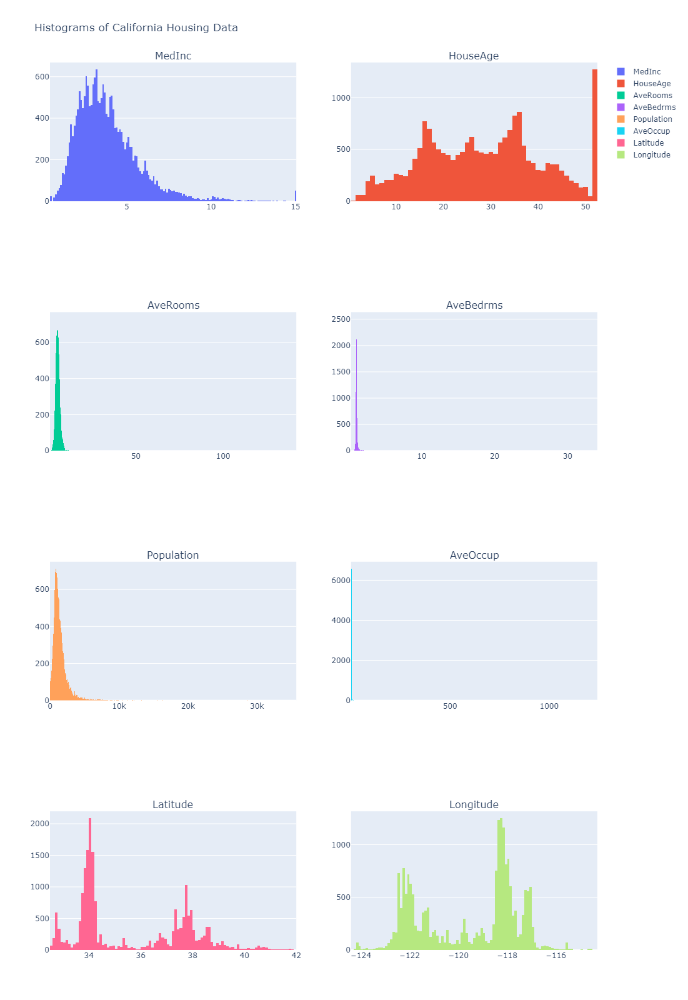

In [4]:
# Determine the number of rows and columns for the subplots
n_cols = 2  # Set the number of columns
n_rows = (len(data.columns) + 1) // n_cols  # Calculate the number of rows

# Create subplots
fig = make_subplots(rows=n_rows, cols=n_cols, subplot_titles=data.columns)

# Add a histogram to each subplot
for i, column in enumerate(data.columns):
    row = (i // n_cols) + 1
    col = (i % n_cols) + 1
    fig.add_trace(
        go.Histogram(x=data[column], name=column),
        row=row, col=col
    )

# Update layout
fig.update_layout(height=400 * n_rows, title_text="Histograms of California Housing Data")
fig.show()

After loading the dataset, we randomly divide it to obtain a training set and a testing set.

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
14196,3.2596,33.0,5.017657,1.006421,2300.0,3.691814,32.71,-117.03
8267,3.8125,49.0,4.473545,1.041005,1314.0,1.738095,33.77,-118.16
17445,4.1563,4.0,5.645833,0.985119,915.0,2.723214,34.66,-120.48
14265,1.9425,36.0,4.002817,1.033803,1418.0,3.994366,32.69,-117.11
2271,3.5542,43.0,6.268421,1.134211,874.0,2.300000,36.78,-119.80
...,...,...,...,...,...,...,...,...
11284,6.3700,35.0,6.129032,0.926267,658.0,3.032258,33.78,-117.96
11964,3.0500,33.0,6.868597,1.269488,1753.0,3.904232,34.02,-117.43
5390,2.9344,36.0,3.986717,1.079696,1756.0,3.332068,34.03,-118.38
860,5.7192,15.0,6.395349,1.067979,1777.0,3.178891,37.58,-121.96


Inspect the relation between the target variable (the variable ou wish to explain) and your features (the variables that help predict your target).

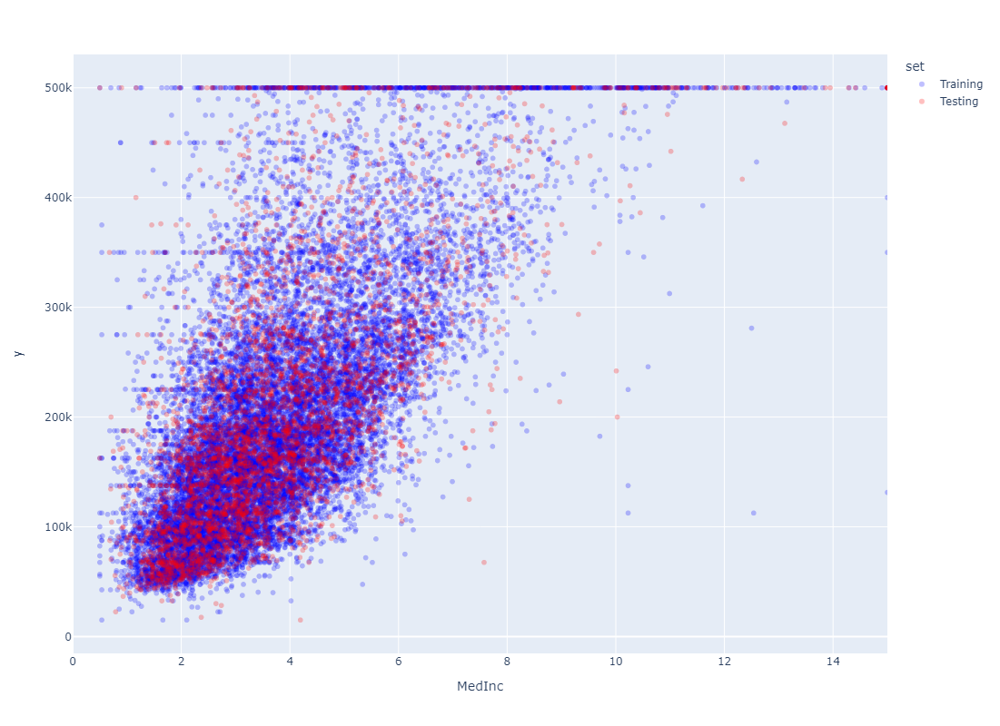

In [6]:
X_feature='MedInc' # you can change this to any other feature in the dataframe above to visually inspect the dependency. 

# Create a DataFrame for the training data
train_df = pd.DataFrame(X_train, columns=[X_feature])
train_df['y'] = (y_train*100000)
train_df['set'] = 'Training'

# Create a DataFrame for the testing data
test_df = pd.DataFrame(X_test, columns=[X_feature])
test_df['y'] = (y_test*100000)
test_df['set'] = 'Testing'

# Combine the DataFrames
combined_df = pd.concat([train_df, test_df])

# Plot the scatter plot
fig = px.scatter(combined_df, x=X_feature, y='y', color='set',
                 color_discrete_map={'Training': 'blue', 'Testing': 'red'},
                opacity=0.25, range_x=[0,15])

# Update the figure layout to set the size
fig.update_layout(width=1000, height=800)  # Change the width and height as needed

fig.show()

## Step 2: Train your model

To build the prediction model, we use the training dataset `X_train`, `y_train` with a **GradientBoosting** regressor. 

    --> Note that since we will use agnostic methods, the type of model used does not really matter. 
    
As an indication, we give also the mean square error on the training and testing set. As mentioned here, it is always important to evaluate a model before explaining it.

    --> Warning: Features that are deemed of low importance for a bad model (low cross-validation score) could be very important for a good model. Therefore it is always important to evaluate the predictive power of a model using a held-out set (or better with cross-validation) prior to computing importances.

In [7]:
from sklearn import ensemble
from sklearn.metrics import mean_squared_error

params = {
    "n_estimators": 500,
    "max_depth": 4,
    "min_samples_split": 5,
    "learning_rate": 0.01,
    "loss": "squared_error",
}

# Train your prediction model:
reg = ensemble.GradientBoostingRegressor(**params, random_state=42)
reg.fit(X_train, y_train)

# Check your model in-sample perfromance:
mse_train = mean_squared_error(y_train, reg.predict(X_train))
print("The mean squared error (MSE) on training set: {:.4f}".format(mse_train))

# Check your model out-of-sample perfromance:
mse_test = mean_squared_error(y_test, reg.predict(X_test))
print("The mean squared error (MSE) on testing set: {:.4f}".format(mse_test))

The mean squared error (MSE) on training set: 0.2585
The mean squared error (MSE) on testing set: 0.2954


## Step 3: Evaluate results

### Permutation Importance

This technique attempts to identify the input variables that your model considers to be important. Permutation importance is an agnostic and a global (i.e., model-wide) technique that evaluates input features in terms of their usefulness in predicting a target variable across the model's prediction space. 

It is defined as the decrease in the accuracy score of a model when a single feature value is randomly shuffled in the testing set. The decrease in model score indicates how much the model depends on the feature.

If we randomly shuffle a single column of a testing dataset (e.g., `Population`), leaving the target and all other columns in place, how would that affect the accuracy of the predictions in this now mixed data?

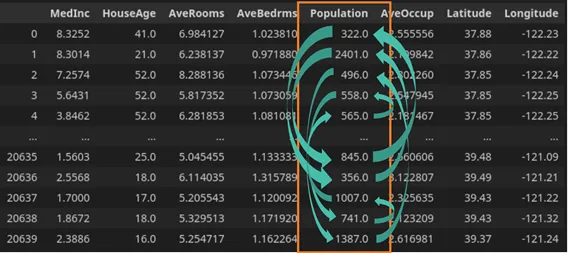

The reasoning behind this method is that by randomly shuffling a variable, we remove all useful information contained in this variable. If the variable was very important to the prediction model, then we would expect the performance of the model to be strongly negatively impacted. This method has the advantage of being intuitive and easy to understand.

The process of Permutation Importance is as follw

    
:   Get a trained predictive model and calculate its accuracy on the testingets
    2.   Shuffle the values in a column of the testing set, and calculate its accuracy on the resulting ds se
       - . Measure how much the accuracy has suffered due to this shul- in
       - . This deterioration in performance is a measure of the importance of the variable just shuledf3.    3.    Put the data back in the original order (undo the random set frome - p 2). Now repeat step 2 with the next column in the data set, until you have calculated the importance of each column.

Steps 2 and 3 can be repeated several times to get more information about eac var`iab`le

Sc`iki`t-learn provides an easy ways o calc[ula[te the PermuImportancetation ](https://scikit-learn.org/stable/modules/permutation_importancortance. We have to provide tfunction:o thction: the red cove`m`
- `e
-  reg ,thetstien tg tsst` att`` 
-e t`d
- y_ts , the number of times that steps 2 ad  ar,e` re`perted nspea`

-  =10 , and the scoring function used to estimate the preiction` ac`curacy scoring='neg_men_squa`red`_error'.

In [21]:
from sklearn.inspection import permutation_importance

res_pi = permutation_importance(reg, X_test, y_test, n_repeats=10, n_jobs=2, 
                                scoring='neg_mean_squared_error', random_state=42)
res_pi

{'importances_mean': array([0.97932519, 0.04428442, 0.01866229, 0.00714949, 0.00227961,
        0.20390172, 0.54188442, 0.47603467]),
 'importances_std': array([0.02129122, 0.00229943, 0.0019165 , 0.00065457, 0.00026126,
        0.00574557, 0.01286151, 0.00922909]),
 'importances': array([[0.99744544, 0.99152476, 0.96663662, 0.9815587 , 0.94787318,
         0.98743592, 0.99001279, 0.99174678, 1.00395989, 0.93505786],
        [0.04518484, 0.03999234, 0.04224688, 0.04674271, 0.04377569,
         0.04631214, 0.0412838 , 0.04464783, 0.04721764, 0.0454403 ],
        [0.01963807, 0.02100029, 0.02110505, 0.0143579 , 0.01975566,
         0.01860509, 0.01758582, 0.01811696, 0.01704873, 0.01940926],
        [0.00816834, 0.00686259, 0.00790047, 0.00778268, 0.00681998,
         0.0061502 , 0.00732576, 0.00747752, 0.00625939, 0.00674802],
        [0.0023033 , 0.00191737, 0.00280989, 0.00243528, 0.00250213,
         0.00200695, 0.00219493, 0.00232586, 0.00234858, 0.00195184],
        [0.19963029, 0.

If we look at output of the `permutation_importnace` function (`res_pi`):
- `  importances_me`an: averages of the loss of accuracy after the shuffles calculated for the 10 repetitions- `   importances_`std: same for the standard deviatio- `    importa`nces: the raw data used to calculate the means and standard deviationOf course, i.

It is easier to interpret the results visually.

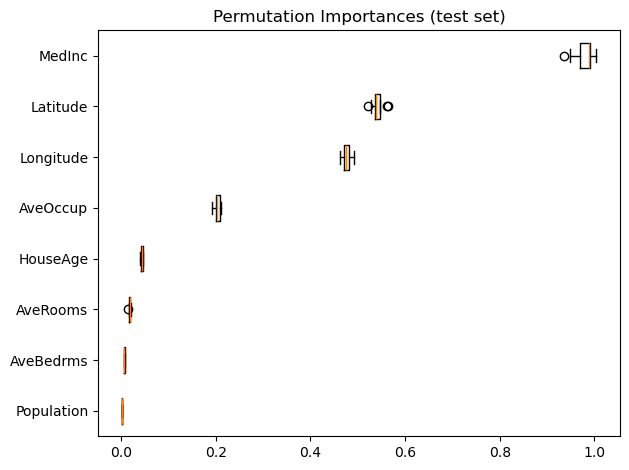

In [23]:
# sort and put the most important features on top (for plotting)
sorted_idx = res_pi.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(
    res_pi.importances[sorted_idx].T, vert=False, labels=X_test.columns[sorted_idx]
)
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

**Interpretation of the plot**: The variables at the top are the most important, and those at the bottom are the least important. The values on the $x$-axis indicate how much the model performance decreased with random shuffling (in this case, using `neg_mean_squared_error` as the performance metric). 

In this figure, the variable `MedInc` (i.e., median income in block group) seems to be the most important for our model.

### Partial Dependence Plots (PDP)

This technique attempts to identify how each feature affects your predictions. The easiest way to understand the PDP is perhaps to start with an example. The PDP produce the following type of plot where we can see the average evolution of the model output according to one of the variable

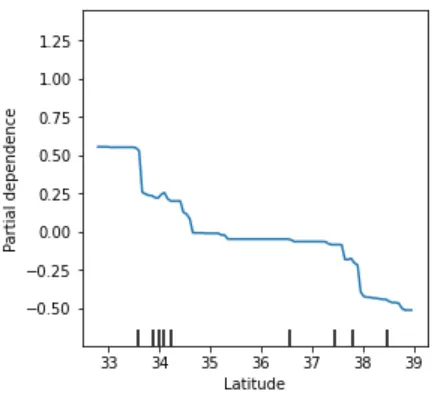

Here we can see that house prices tend to decrease as latitude increases, with a plateau between 35 and 37. This is useful for answering questions such as: controlling for all other housing characteristics, what is the impact of latitude on house prices? Partial dependency graphs can show whether the relationship between the target and a feature is linear, monotonic or more complex.

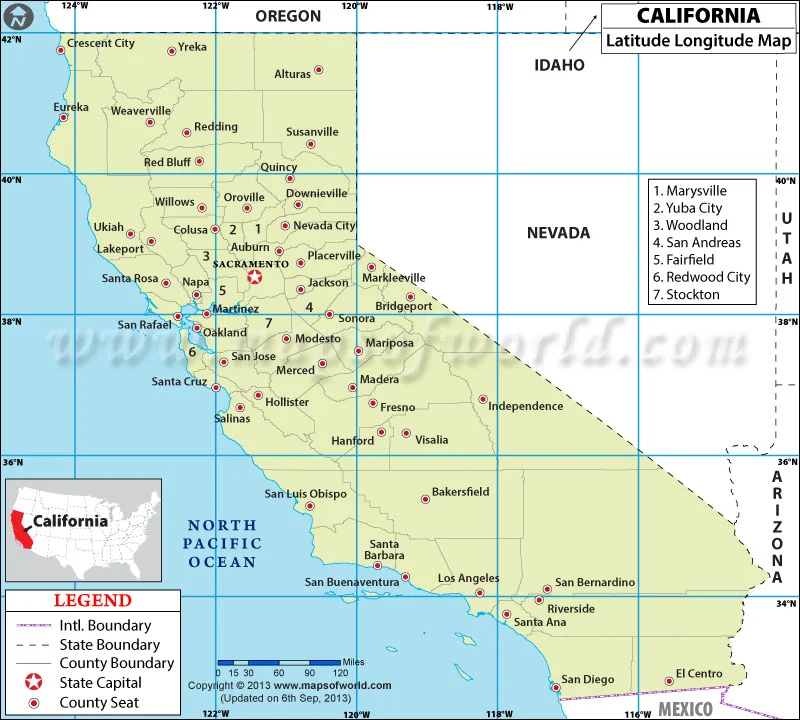

`Scikit-learn` provides an easy to use function to calculate the partial dependence plots (PDP). We have to provide to this function: 
- the predictive model `reg`,
- the input of the testing set `X_test`.

In the example below, we also provide `sorted_idx` (already calculated earlier) so that the values are in the same order as in the permutation importance and `ax` to display them in the right figure.

s.s.

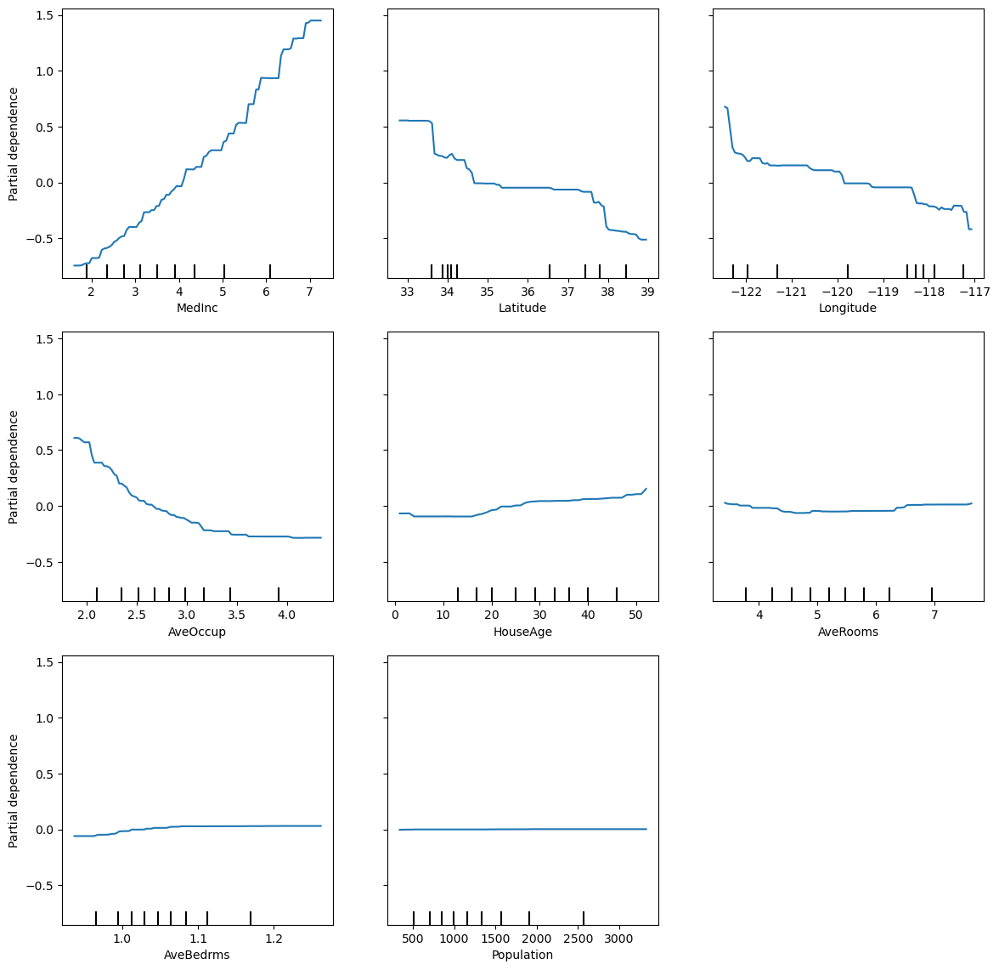

In [28]:
from sklearn.inspection import PartialDependenceDisplay

inverted_idx = sorted_idx[::-1]

fig, ax = plt.subplots(figsize=(14, 14))
PartialDependenceDisplay.from_estimator(reg, X_test, inverted_idx, ax=ax)
plt.show()

This figure shows the average evolution of the model predictions when the different variables evolve. If we compare this result with the permutation importance, we see that indeed the `Population` variable does not seem to have much impact on house prices in California districts. On the other hand, the variable `MedInc` seems to have a lot of impact and now we can also see that it is a proportional impact.

It is also easy to consider two variables at the same time with partial dependence plots which allows to take into account the interactions between the variables.

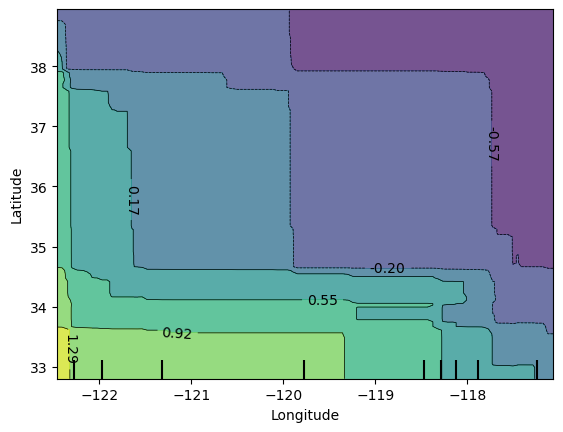

In [29]:
PartialDependenceDisplay.from_estimator(reg, X_test, [['Longitude','Latitude']])

### SHapley Additive exPlanations (SHAP) Value

This technique attempts to understand individual predictions. The SHAP method is based on Shapley values, a well-known measure in economics and game theory for evaluating the impact of different participants in a cooperative game.

In a cooperative game, players have the possibility to forge coalitions to achieve a common goal. One difficulty in the theory of cooperative games is the distribution of benefits among the players. Suppose a coalition of three players has generated a profit of 100 credits, how do you “fairly” distribute this profit? Shapley value provides a way to distribute these profits fairly. For a mathematician, “distribute fairly” means nothing. We need axioms that correctly express what is “fairly” and for that, four axioms have been defined mathematically.

- **Efficiency**: all revenues (costs) of the coalition are redistributed among the players (no more, no less).
- **Symmetry**: players who make the same contribution receive the same share.
- **Additivity**: if you bring more, you get more.
- **Dummy player**: those who contribute nothing, receive nothing.

It has been proven by [Lloyd Shapley](https://en.wikipedia.org/wiki/Lloyd_Shapley) that, in a cooperative game, the Shapley value is the unique solution that respects the desired properties.

The SHAP in the XAI context is a **local** and **agnostic** method. We treat each input variable like a player in a game where the coalition game is the model that will use the contributions of each player to make a prediction. The payout of this game is the prediction and we will use the Shapley value to divide this payout fairly between the players (i.e., the input variables).

In the example below, a black box machine learning model uses four input variables. Each variable makes a contribution to a cooperative game (i.e., the model) and the output of the game is the prediction.

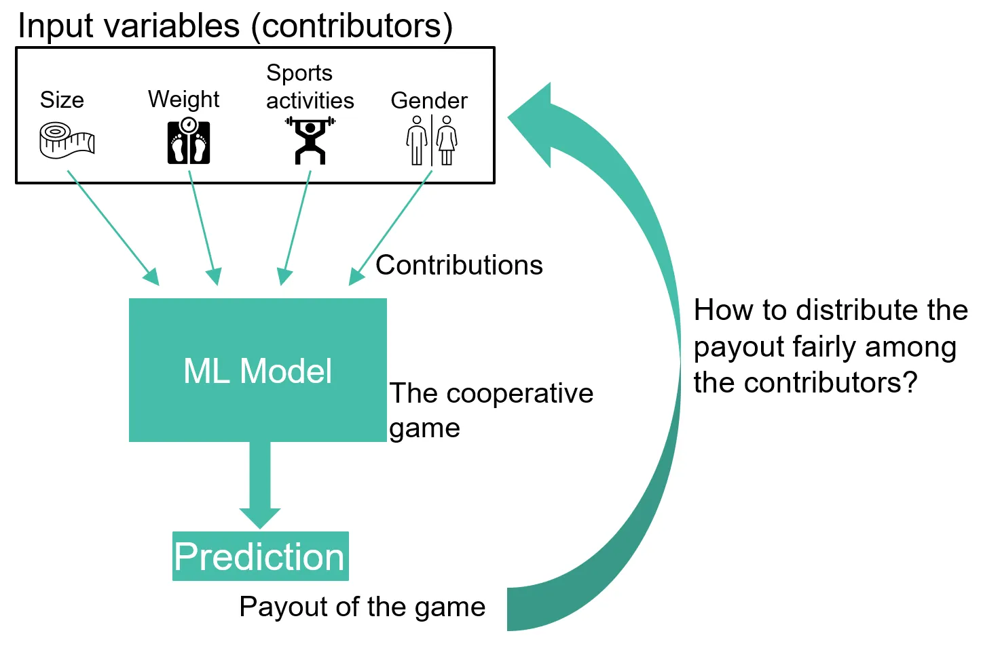



The `shap` module of Python allows to obtain easily the contribution of each variable during a prediction. As `shap` is a local explanation technique, we start by choosing an observation in the test set and we use the model to make a prediction on it (i.e.: 2.3390358700186686). We will now try to understand why the model gives this prediction to this observation.

In [30]:
!pip install shap

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/453.1 kB ? eta -:--:--
   --- ----------------------------------- 41.0/453.1 kB 960.0 kB/s eta 0:00:01
   --------------- ------------------------ 174.1/453.1 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------- 453.1/453.1 kB 3.5 MB/s eta 0:00:00


In [31]:
row_to_show = [6]
data_for_prediction = X_test.iloc[row_to_show]

print('The data for prediction:')
print(data_for_prediction)

print('\n\nThe prediction:', reg.predict(data_for_prediction)[0])

The data for prediction:
      MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
7113  5.0839      36.0  6.221719   1.095023       670.0  3.031674     33.89   

      Longitude  
7113    -118.02  


The prediction: 2.3390358700186686


The exact calculation of the Shapley value is computationally very complex. Although SHAP is a agnostic XAI method, there are several ways to compute the Shapley value:
- **  Kernel Sh**ap: Agnostic method that works with all types of models, but tends to be slower and less accurate to estimate the Shapley value- **   Tree S**hap: faster and more accurate than Kernel Shap but only works with the tree model- **    Deep **Shap: faster and more accurate than Kernel Shap but only works with deep learning models.

As in our case, the `mod`el reg** is a GradientBo**osting regressor, we use the Tree Shap. Note that we could also have used Kernel Shap because this method works with all types of .models

In [32]:
import shap

explainer = shap.TreeExplainer(reg)
shap_values = explainer.shap_values(data_for_prediction)
shap_values

array([[ 0.30874621,  0.03620116, -0.02549494,  0.03090186,  0.00087705,
        -0.2226369 ,  0.27795437, -0.13945988]])

These values are the 8 Shapley values of the 8 input variables for the above predictions (i.e.: 2.3390358700186686). 

Some Shapley values are positive and others negative. 
- Positive values contribute to a higher output value of the predictive model and vice versa for negative Shapley values.
- For example the Shaply value of `MedInc` is 0.30874621 and the Shaply value of `AveOccup` is -0.2226369.

The `shap` module provides a way to visualize the results in a more user-friendly format.

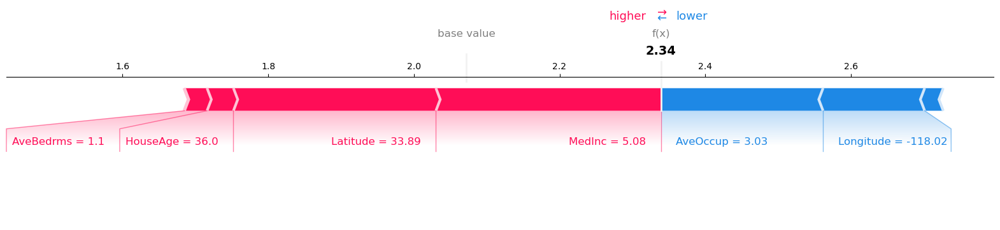

In [33]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, data_for_prediction.round(2), matplotlib=True)

Let's take a moment to interpret this figure. 

The variables in red are the variables that have a positive Shapley value and variables in blue have a negative contribution to the prediction (i.e., negative Shapley values). 
- For example: with a Shapley value of -0.2226369, the variable `AveOccup` appears in blue in the figure. Note that the number 3.03 associated with the variable `AveOccup` in the figure is not the Shapley value but is the value taken by the variable (see above).
- The length of the interval corresponds to the Shapley value. For instance, the Shapley value of `MedInc` is 0.30874621 and it corresponds to the length of `MedInc` in the figure.

In the figure, you can see a grey mark that indicates the base value
- . It is a reference value and Shapley values allow to explain how we go from this reference value to the prediction done by the mod.
- For example,e. 2.3390358700186686, on the figure the prediction is rounded to 2.4
- . The base value corresponds in a way to what we can predict when we have no information on the input variable

. When we have no information, one of the values we can give is simply the average of the predictions on the training se . And the following code shows that this is indeed the case, the two values are exactly the sa:e.

In [34]:
print(reg.predict(X_train).mean())
print(explainer.expected_value[0]) # Base value

2.071946937378876
2.071946937378876


In the figure, if we add all the positive contributions in red and subtract all the negative contributions, then the Shapley values explain how we get from the base value to the prediction.

In [35]:
shap_values.sum() # 0.26708893263979216

0.26708893263979216

If we add up all the Shapley values, we get 0.26708893263979216 which is exactly the distance between the base value (i.e., 2.071946937378876) and the prediction (i.e., 2.339035870018668).

We can also see this by adding the base value with the sum of the Shapley values and see that it is equal to the prediction.

In [36]:
print(explainer.expected_value[0] + shap_values.sum())
print(reg.predict(data_for_prediction)[0])

2.339035870018668
2.3390358700186686
